# <center>**RADIOMICS ANALYSIS - Descriptive Statistics**</center>

(*Step 9*)

## **Radiomics Workflow:**
  
  **1. Download** DICOM images and convert to **NRRD.**

  **2.** Perform **target segmentations** and save in **NRRD.**
  
  **3.** Perform a **first Radiomic Features** ***Dummy*** **Extraction,** to:
    
  - Detect **erros in segmentations**: only one dimension, no label 1, only one segmented voxel...
  - Analyze **binwith**.


  **4. Analyze** and **correct mask errors.**

  **5. Adjust binwith.**
   - **Tune featureextractor param file.**


  **6.** Perform **final Radiomic Feature Extraction.**

  **7. Clean Radiomic Features.**

  **8. Merge** with **labels** and **clinical data.**

  **9. Descriptive Statistics.**

  **10. Inferential Statistics.**

  **11. Machine Learning.**

## **DESCRIPTIVE STATISTICS**

0. **Environment configuration.**
1. **Load data.**
2. **Filter Patients without segmentations.**
3. **Check Variables & Datatypes.**
4. **Descriptive Statistics (Stats and Plots).**
   * 4.1. Quantitative variables.
   * 4.2. Categorical variables (Qualitative vars).

In [1]:
import os
import numpy as np
import pandas as pd
from scipy.stats import skew, kurtosis
import matplotlib.pyplot as plt
import seaborn as sns

### **0. Environment configuration.**

#### Set the working directory

In [2]:
# Set working directory
wd = '/Users/pablomenendezfernandez-miranda/Proyecto Otosclerosis/'
os.chdir(wd)

print(f'Directorio actual: {os.getcwd()}')

# Check directory files
print(f'Directory files: {os.listdir(wd)}')

Directorio actual: /Users/pablomenendezfernandez-miranda/Proyecto Otosclerosis
Directory files: ['Tables', 'Databases', '.DS_Store', 'CITATION.cff', 'Episodes', 'Figures', 'LICENSE.txt', 'Notebooks']


#### Mount Drive (if executed on Google Colab)

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

#### Print All DataFrame

In [4]:
# PRINT FULL DATAFRAME

def df_show_full(show):
  if show == True:
    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)
  if show == False:
    pd.reset_option('display.max_rows')
    pd.reset_option('display.max_columns')

df_show_full(True)

#### Save Tables

In [5]:
# Save Table
def df_save_tab(df_tab, path, name):
  df_tab.to_excel(os.path.join(path + name + '.xlsx'))
  df_tab.to_csv(os.path.join(path + name + '.csv'))

### **1. Load data**

In [6]:
# Load data
df_dir= 'Databases/6_df_radiomics_&_clinical.feather'
df_all_patientes= pd.read_feather(df_dir)
print(df_all_patientes.shape)

(127, 1347)


### **2. Filter Patients without segmentations**

In [7]:
# Select Radiomic Feature columns
R_cols= [col for col in df_all_patientes.columns if col.startswith('R_')]

# Remove rows with all NaN in Radiomic Feature columns (patients without segmentations)
df = df_all_patientes.dropna(subset=R_cols, how='all')

# Get patients removed
diff = df_all_patientes.merge(df, how='left', indicator=True)
patients_removed= list(diff.loc[diff['_merge'] == 'left_only', 'EPI_CODE'])
patients_removed.sort()

# Print report
print(f'{len(patients_removed)} removed patientes: {patients_removed}') # Other patients are not
print('')

print(df.shape)
df.head(4)

28 removed patientes: ['EPI_0010', 'EPI_0011', 'EPI_0013', 'EPI_0017', 'EPI_0018', 'EPI_0033', 'EPI_0036', 'EPI_0039', 'EPI_0043', 'EPI_0044', 'EPI_0045', 'EPI_0049', 'EPI_0050', 'EPI_0053', 'EPI_0054', 'EPI_0055', 'EPI_0059', 'EPI_0065', 'EPI_0070', 'EPI_0073', 'EPI_0079', 'EPI_0084', 'EPI_0098', 'EPI_0099', 'EPI_0108', 'EPI_0109', 'EPI_0124', 'EPI_0125']

(99, 1347)


EPI_CODE     Sex Pathological_Ear Hearing_impairment_Pathological_Ear  \
0  EPI_0001  Hombre   Oído izquierdo                 Moderado (40-70 dB)   
1  EPI_0002   Mujer   Oído izquierdo                 Moderado (40-70 dB)   
2  EPI_0003   Mujer     Oído derecho                 Moderado (40-70 dB)   
3  EPI_0004  Hombre     Oído derecho                 Moderado (40-70 dB)   

   Sensorineural_impairment_dB_250Hz  Sensorineural_impairment_dB_500Hz  \
0                               25.0                               35.0   
1                                0.0                               10.0   
2                               35.0                               35.0   
3                                0.0                                5.0   

   Sensorineural_impairment_dB_1000Hz  Sensorineural_impairment_dB_2000Hz  \
0                                35.0                                45.0   
1                                20.0                                30.0   
2                                25.0                                60.0   
3                                20.0                                30.0   

   Sensorineural_impairment_dB_3000Hz  Sensorineural_impairment_dB_4000Hz  \
0                                35.0                                15.0   
1                                10.0                                 5.0   
2                                55.0                                50.0   
3                                20.0                                20.0   

      Carhart_notch  Conductive_impairment_dB_250Hz  \
0  Presente (<15dB)                            70.0   
1  Presente (>15dB)                            60.0   
2  Presente (<15dB)                            75.0   
3  Presente (<15dB)                            45.0   

   Conductive_impairment_dB_500Hz  Conductive_impairment_dB_1000Hz  \
0                            70.0                             65.0   
1                            55.0                             60.0   
2                            70.0                             55.0   
3                            50.0                             50.0   

   Conductive_impairment_dB_2000Hz  Conductive_impairment_dB_3000Hz  \
0                             50.0                             45.0   
1                             40.0                             40.0   
2                             70.0                             80.0   
3                             45.0                             50.0   

   Conductive_impairment_dB_4000Hz  \
0                             45.0   
1                             45.0   
2                             75.0   
3                             55.0   

  Temporal_Bone_CT_scan_Findings_Pathological_Ear Surgical_Treatment  \
0                                   Sin hallazgos      Estapedotomía   
1                       Otosclerosis antefenestra      Estapedotomía   
2                       Otosclerosis antefenestra      Estapedotomía   
3                       Otosclerosis antefenestra      Estapedotomía   

  Post_surgical_Vertigo  \
0                    No   
1                    No   
2                    No   
3                    No   

  One_Week_Post_surgical_Tonal_Audiometry_Pathological_Ear  \
0                                   Hipoacusia mixta         
1                                   Hipoacusia mixta         
2                                   Hipoacusia mixta         
3                                                NaN         

  Hearing_impairment_One_Week_Post_surgical  \
0                       Moderado (40-70 dB)   
1                           Leve (20-40 dB)   
2                       Moderado (40-70 dB)   
3                                       NaN   

  One_Month_Post_surgical_Tonal_Audiometry_Pathological_Ear  \
0                         Hipoacusia neurossensorial          
1                                   Hipoacusia mixta          
2                                   Hipoacusia mixta          
3   

### **3. Check Variables & Datatypes**


In [8]:
# Check variables
print(df.columns.to_list(), end='')

['EPI_CODE', 'Sex', 'Pathological_Ear', 'Hearing_impairment_Pathological_Ear', 'Sensorineural_impairment_dB_250Hz', 'Sensorineural_impairment_dB_500Hz', 'Sensorineural_impairment_dB_1000Hz', 'Sensorineural_impairment_dB_2000Hz', 'Sensorineural_impairment_dB_3000Hz', 'Sensorineural_impairment_dB_4000Hz', 'Carhart_notch', 'Conductive_impairment_dB_250Hz', 'Conductive_impairment_dB_500Hz', 'Conductive_impairment_dB_1000Hz', 'Conductive_impairment_dB_2000Hz', 'Conductive_impairment_dB_3000Hz', 'Conductive_impairment_dB_4000Hz', 'Temporal_Bone_CT_scan_Findings_Pathological_Ear', 'Surgical_Treatment', 'Post_surgical_Vertigo', 'One_Week_Post_surgical_Tonal_Audiometry_Pathological_Ear', 'Hearing_impairment_One_Week_Post_surgical', 'One_Month_Post_surgical_Tonal_Audiometry_Pathological_Ear', 'Hearing_impairment_One_Month_Post_surgical', 'Otosclerosis_Contralateral_Ear', 'Label', 'age', 'Label_extended', 'R_STAPES_original_shape_Elongation', 'R_STAPES_original_shape_LeastAxisLength', 'R_STAPES_o

In [9]:
# Check datatypes
dtypes_count= df.dtypes.value_counts()

objects=    dtypes_count[dtypes_count.index == 'object'].sum()
floats64=   dtypes_count[dtypes_count.index == 'float64'].sum()
categories= dtypes_count[dtypes_count.index == 'category'].sum()

print(f'object:   {objects}')
print(f'float64:  {floats64}')
print(f'category: {categories}')
print(f'---------------')
print(f'Total:    {objects + floats64 + categories}')

object:   1
float64:  1332
category: 14
---------------
Total:    1347


### **4. Descriptive Statistics**

* 4.1. Descriptive stats
* 4.2. Descriptive plots

In [10]:
# Select Quantitative and Categorical variables
idx_quantitatives= [idx for idx, dtype in enumerate (df.dtypes) if dtype == 'float64']
idx_categories=    [idx for idx, dtype in enumerate (df.dtypes) if dtype == 'category']

quantitatives= df.columns[idx_quantitatives]
categories=    df.columns[idx_categories]

print(f'Quantitatives: {len(quantitatives)}')
print(f'Categories (Qualitatives): {len(categories)}')

Quantitatives: 1332
Categories (Qualitatives): 14


#### **4.1. Quantitative variables**

In [11]:
# Descriptive statistics of Quantitative variables
quant_desc_stats = df[quantitatives].describe()

# Add Skewness and Kurtosis following Pearson's definition (normal ==> 3.0)
kurtosis_values = kurtosis(df[quantitatives], nan_policy='omit', fisher=False)
skewness_values = skew(df[quantitatives], nan_policy='omit')

quant_desc_stats.loc['kurtosis'] = kurtosis_values
quant_desc_stats.loc['skewness'] = skewness_values

# Round values
quant_desc_stats_ = round(quant_desc_stats,2)

# Save Descriptive Stats
df_save_tab(quant_desc_stats_, 'Tables/', '1_1_quant_desc_stats')

# Show stats
quant_desc_stats_

Sensorineural_impairment_dB_250Hz  \
count                                 51.00   
mean                                  10.78   
std                                   11.46   
min                                    0.00   
25%                                    0.00   
50%                                   10.00   
75%                                   15.00   
max                                   40.00   
kurtosis                               3.25   
skewness                               1.06   

          Sensorineural_impairment_dB_500Hz  \
count                                 51.00   
mean                                  21.08   
std                                   13.32   
min                                    0.00   
25%                                   10.00   
50%                                   20.00   
75%                                   30.00   
max                                   55.00   
kurtosis                               3.02   
skewness                               0.69   

          Sensorineural_impairment_dB_1000Hz  \
count                                  51.00   
mean                                   28.63   
std                                    13.08   
min                                     5.00   
25%                                    20.00   
50%                                    25.00   
75%                                    37.50   
max                                    70.00   
kurtosis                                3.61   
skewness                                0.66   

          Sensorineural_impairment_dB_2000Hz  \
count                                  51.00   
mean                                   39.41   
std                                    14.65   
min                                    10.00   
25%                                    30.00   
50%                                    40.00   
75%                                    47.50   
max                                    75.00   
kurtosis                                2.99   
skewness                                0.53   

          Sensorineural_impairment_dB_3000Hz  \
count                                  41.00   
mean                                   37.56   
std                                    16.28   
min                                     5.00   
25%                                    25.00   
50%                                    40.00   
75%                                    50.00   
max                                    75.00   
kurtosis                                2.65   
skewness                                0.01   

          Sensorineural_impairment_dB_4000Hz  Conductive_impairment_dB_250Hz  \
count                                  51.00                           51.00   
mean                                   31.84                           61.37   
std                                    18.73                           18.68   
min                                     0.00                           30.00   
25%                                    17.50                           45.00   
50%                                    34.00                           60.00   
75%                                    45.00                           72.50   
max                                    75.00                          110.00   
kurtosis                                2.32                            3.02   
skewness                                0.38                            0.68   

          Conductive_impairment_dB_500Hz  Conductive_impairment_dB_1000Hz  \
count                              51.00                            51.00   
mean                               61.76                            59.90   
std                                17.60                            17.16   
min                                30.00                            30.00   
25%                                50.00                            50.00   
50%                                60.00    

In [12]:
# Check for an especific variable
var= 'age'
pd.DataFrame(quant_desc_stats_[var])

,age
count,99.00
mean,52.00
std,14.48
min,13.00
25%,45.50
50%,54.00
75%,61.00
max,83.00
kurtosis,3.54
skewness,-0.71


(-0.5, 999.5, 4999.5, -0.5)

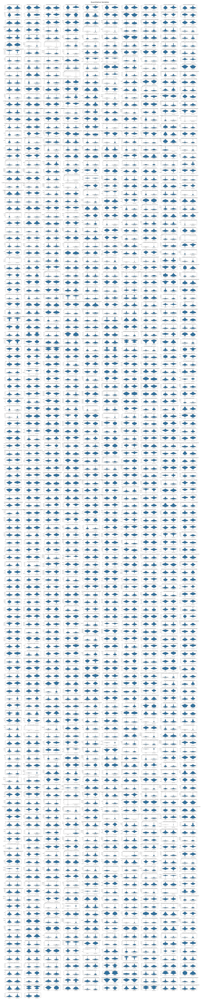

In [13]:
# Plotting Quantitative variable Distributions

# Set up plot grid
num_vars = len(quantitatives)
n_cols = 10
n_rows = int(np.ceil(num_vars / n_cols))

# Create figure
fig_qt, axes = plt.subplots(n_rows, n_cols, figsize=(50, n_rows * 2), sharex=False, sharey=False)
fig_qt.suptitle('Quantitative Variables', fontsize=30, y=1)
axes = axes.flatten()

# Create subplots
for i, var in enumerate(quantitatives):

  sns.violinplot(data=df, x='Label', y=var, ax=axes[i], inner='quartile')

  axes[i].set_title(var)
  axes[i].set_xlabel('')
  axes[i].set_ylabel('')

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig_qt.delaxes(axes[j])

# Ajust spaces and show
plt.tight_layout()
plt.show()

# Save plot
fig_qt_dir= 'Figures/'
fig_qt.savefig(fig_qt_dir + '2_1_violin_plots_all_quantitatives.pdf', format='pdf', bbox_inches='tight', dpi=1200)

#### **4.2. Categorical variables (Qualitative vars)**

In [14]:
# View Categories - Qualitative variables
categories

Index(['Sex', 'Pathological_Ear', 'Hearing_impairment_Pathological_Ear',
       'Carhart_notch', 'Temporal_Bone_CT_scan_Findings_Pathological_Ear',
       'Surgical_Treatment', 'Post_surgical_Vertigo',
       'One_Week_Post_surgical_Tonal_Audiometry_Pathological_Ear',
       'Hearing_impairment_One_Week_Post_surgical',
       'One_Month_Post_surgical_Tonal_Audiometry_Pathological_Ear',
       'Hearing_impairment_One_Month_Post_surgical',
       'Otosclerosis_Contralateral_Ear', 'Label', 'Label_extended'],
      dtype='object')

In [19]:
# Remove empty categories (categories emptied when filtering patients without segmentations)
for cat_ in categories:
    df.loc[:, cat_] = df[cat_].cat.remove_unused_categories()

In [16]:
# Descriptive Stats for Categories - Qualitative variables

def freqtab (df, column, decimals, NA_empty_remove=False):

    df2= df.copy()
    df2[column]= df2[column].cat.add_categories('NA')
    table= pd.crosstab(index=df2[column].fillna('NA'), columns='count', dropna=False)
    table.rename(columns={'count':'count (n)'}, inplace=True)
    table['percentage (%)']= [float(round((value/sum(table['count (n)'].values.tolist())*100),decimals)) for value in table['count (n)'].values.tolist()]
    total= pd.DataFrame(data=[[sum(table['count (n)'].values.tolist()), sum(table['percentage (%)'].values.tolist())]], columns=table.columns.to_list(), index=['TOTAL'])
    table= pd.concat([table,total], axis=0)
    table= table.rename_axis(column, axis=1)
    if NA_empty_remove == True:
        table = table[table['count (n)'] != 0]

    return table

In [17]:
idx= 1
for category in categories:
  freq_tab= freqtab (df, category, decimals=2, NA_empty_remove=True)
  df_save_tab(freq_tab, 'Tables/', '1_2_' + str(idx) + '_freq_tab_' + category)
  idx+=1  
  print('\n')
  display(freq_tab)

Sex,count (n),percentage (%)
Hombre,58,58.59
Mujer,41,41.41
TOTAL,99,100.00


Pathological_Ear,count (n),percentage (%)
Oído derecho,50,50.51
Oído izquierdo,49,49.49
TOTAL,99,100.00


Hearing_impairment_Pathological_Ear,count (n),percentage (%)
Leve (20-40 dB),5,5.05
Moderado (40-70 dB),32,32.32
Normoacusia (<20 dB),1,1.01
Profundo (> 90 dB),2,2.02
Severo (70-90 dB),11,11.11
NA,48,48.48
TOTAL,99,99.99


Carhart_notch,count (n),percentage (%)
Ausente,28,28.28
Presente (<15dB),18,18.18
Presente (>15dB),5,5.05
NA,48,48.48
TOTAL,99,99.99


Temporal_Bone_CT_scan_Findings_Pathological_Ear,count (n),percentage (%)
Otoesclerosis mixta (ambas),2,2.02
Otosclerosis antefenestra,39,39.39
Sin hallazgos,58,58.59
TOTAL,99,100.00


Surgical_Treatment,count (n),percentage (%)
Estapedotomía,49,49.49
"Estapedotomía, pero por malformación de estibo",1,1.01
Timpanoplastia - PORP,1,1.01
NA,48,48.48
TOTAL,99,99.99


Post_surgical_Vertigo,count (n),percentage (%)
No,44,44.44
Sí,7,7.07
NA,48,48.48
TOTAL,99,99.99


One_Week_Post_surgical_Tonal_Audiometry_Pathological_Ear,count (n),percentage (%)
Hipoacusia de transmisión,1,1.01
Hipoacusia mixta,25,25.25
Hipoacusia neurossensorial,7,7.07
NA,66,66.67
TOTAL,99,100.00


Hearing_impairment_One_Week_Post_surgical,count (n),percentage (%)
Leve (20-40 dB),9,9.09
Moderado (40-70 dB),21,21.21
Severo (70-90 dB),3,3.03
NA,66,66.67
TOTAL,99,100.00


One_Month_Post_surgical_Tonal_Audiometry_Pathological_Ear,count (n),percentage (%)
Hipoacusia de transmisión,1,1.01
Hipoacusia mixta,15,15.15
Hipoacusia neurossensorial,24,24.24
Normoacusia,1,1.01
NA,58,58.59
TOTAL,99,100.00


Hearing_impairment_One_Month_Post_surgical,count (n),percentage (%)
Leve (20-40 dB),21,21.21
Moderado (40-70 dB),18,18.18
Normoacusia (<20 dB),1,1.01
Severo (70-90 dB),1,1.01
NA,58,58.59
TOTAL,99,100.00


Otosclerosis_Contralateral_Ear,count (n),percentage (%)
No,18,18.18
"Sí, confirmación clínica + TC",1,1.01
"Sí, confirmación clínica + TC, pero no intervenido",5,5.05
"Sí, confirmación quirúrgica con TC+",14,14.14
"Sí, sospecha en TC",12,12.12
"Sí, sospecha en clínica",1,1.01
NA,48,48.48
TOTAL,99,99.99


Label,count (n),percentage (%)
Normal,51,51.52
Otosclerosis,48,48.48
TOTAL,99,100.00


Label_extended,count (n),percentage (%)
Falta de desarrollo del ligamento platinar,1,1.01
Malformación estribo,1,1.01
Necrosis de rama larga del yunque,1,1.01
NoTC_Otosclerosis,7,7.07
Normal,34,34.34
Normal_ContraOS,14,14.14
Otosclerosis,41,41.41
TOTAL,99,99.99


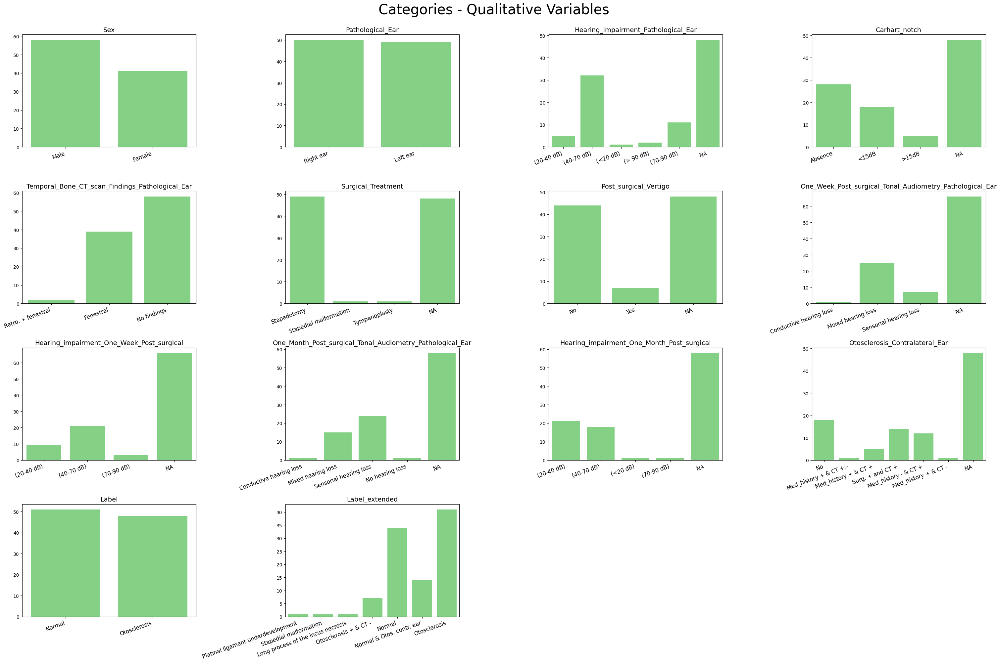

In [18]:
# Plotting Categories - Qualitative variables plots

df2= df.copy()

# Set up plot grid
num_vars= len(categories)
n_cols= 4
n_rows = int(np.ceil(num_vars / n_cols))

# Create figure
fig_ct_ql, axs= plt.subplots(n_rows, n_cols, figsize=(30,20))
fig_ct_ql.suptitle('Categories - Qualitative Variables', fontsize=30, y=1)
axes = axs.flatten()

# Set x_ticks
xticks = {'Sex': ['Male', 'Female'],
          'Pathological_Ear': ['Right ear', 'Left ear'],
          'Hearing_impairment_Pathological_Ear': ['(20-40 dB)', '(40-70 dB)', '(<20 dB)', '(> 90 dB)', '(70-90 dB)', 'NA'],
          'Carhart_notch': ['Absence', '<15dB', '>15dB', 'NA'],
          'Temporal_Bone_CT_scan_Findings_Pathological_Ear': ['Retro. + fenestral', 'Fenestral', 'No findings'],
          'Surgical_Treatment': ['Stapedotomy', 'Stapedial malformation', 'Tympanoplasty', 'NA'],
          'Post_surgical_Vertigo': ['No', 'Yes', 'NA'],
          'One_Week_Post_surgical_Tonal_Audiometry_Pathological_Ear': ['Conductive hearing loss', 'Mixed hearing loss', 'Sensorial hearing loss', 'NA'],
          'Hearing_impairment_One_Week_Post_surgical': ['(20-40 dB)', '(40-70 dB)', '(70-90 dB)', 'NA'],
          'One_Month_Post_surgical_Tonal_Audiometry_Pathological_Ear': ['Conductive hearing loss', 'Mixed hearing loss', 'Sensorial hearing loss', 'No hearing loss', 'NA'],
          'Hearing_impairment_One_Month_Post_surgical': ['(20-40 dB)', '(40-70 dB)', '(<20 dB)', '(70-90 dB)', 'NA'],
          'Otosclerosis_Contralateral_Ear': ['No', 'Med_history + & CT +/-', 'Med_history + & CT +', 'Surg. + and CT +', 'Med_history - & CT +', 'Med_history + & CT -', 'NA'],
          'Label': ['Normal', 'Otosclerosis'],          
          'Label_extended': ['Platinal ligament underdevelopment', 'Stapedial malformation', 'Long process of the incus necrosis', 'Otosclerosis + & CT -', 'Normal', 'Normal & Otos. contr. ear', 'Otosclerosis']}

# Create subplots
for i, var in enumerate(categories):

    # Add NA category if appropriate
    if df2[var].isna().any():
        df2[var]= df2[var].cat.add_categories('NA').fillna('NA')

    # Filter not empty categories
    counts = df2[var].value_counts()
    valid_categories = counts[counts > 0].index.tolist()
    filtered_data = df2[df2[var].isin(valid_categories)]

    # Create plot
    sns.countplot(data=filtered_data, x=var, color='#77DD77', ax=axes[i])
    
    axes[i].set_title(var, fontsize=14)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].set_xticks(range(len(xticks[var])))
    axes[i].set_xticklabels(labels=xticks[var], rotation=20, ha='right', fontsize=8)
    axes[i].tick_params(axis='x', labelsize=12)


# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig_ct_ql.delaxes(axes[j])

# Ajust spaces and show
plt.tight_layout()
plt.show()

# Save plot
fig_ct_ql_dir= 'Figures/'
fig_ct_ql.savefig(fig_ct_ql_dir + '2_2_bar_plots_all_categories_qualitatives.pdf', format='pdf', bbox_inches='tight', dpi=600)